In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/heart-disease/Heart Disease.csv


# **Importing Necessary Libraries.**

In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import pandas_profiling as pp
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.metrics import RocCurveDisplay
import warnings 
warnings.filterwarnings('ignore')

#  **Reading the dataset**

In [4]:
df = pd.read_csv('/kaggle/input/heart-disease/Heart Disease.csv')

In [5]:
#exploring the dataset(First 5 rows)
df.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,No,16.60,Yes,No,No,3,30,No,Female,55-59,White,Yes,Yes,Very good,5,Yes,No,Yes
1,No,20.34,No,No,Yes,0,0,No,Female,80 or older,White,No,Yes,Very good,7,No,No,No
2,No,26.58,Yes,No,No,20,30,No,Male,65-69,White,Yes,Yes,Fair,8,Yes,No,No
3,No,24.21,No,No,No,0,0,No,Female,75-79,White,No,No,Good,6,No,No,Yes
4,No,23.71,No,No,No,28,0,Yes,Female,40-44,White,No,Yes,Very good,8,No,No,No


In [6]:
df.shape

(319795, 18)

In [5]:
#basic summary of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319795 entries, 0 to 319794
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   HeartDisease      319795 non-null  object 
 1   BMI               319795 non-null  float64
 2   Smoking           319795 non-null  object 
 3   AlcoholDrinking   319795 non-null  object 
 4   Stroke            319795 non-null  object 
 5   PhysicalHealth    319795 non-null  int64  
 6   MentalHealth      319795 non-null  int64  
 7   DiffWalking       319795 non-null  object 
 8   Sex               319795 non-null  object 
 9   AgeCategory       319795 non-null  object 
 10  Race              319795 non-null  object 
 11  Diabetic          319795 non-null  object 
 12  PhysicalActivity  319795 non-null  object 
 13  GenHealth         319795 non-null  object 
 14  SleepTime         319795 non-null  int64  
 15  Asthma            319795 non-null  object 
 16  KidneyDisease     31

In [6]:
df.columns

Index(['HeartDisease', 'BMI', 'Smoking', 'AlcoholDrinking', 'Stroke',
       'PhysicalHealth', 'MentalHealth', 'DiffWalking', 'Sex', 'AgeCategory',
       'Race', 'Diabetic', 'PhysicalActivity', 'GenHealth', 'SleepTime',
       'Asthma', 'KidneyDisease', 'SkinCancer'],
      dtype='object')

In [7]:
col = list(df.columns)
categorical_features = []
numerical_features = []
for i in col:
    if len(df[i].unique()) > 6:
        numerical_features.append(i)
    else:
        categorical_features.append(i)

print('Categorical Features :',*categorical_features)
print('Numerical Features :',*numerical_features)

Categorical Features : HeartDisease Smoking AlcoholDrinking Stroke DiffWalking Sex Race Diabetic PhysicalActivity GenHealth Asthma KidneyDisease SkinCancer
Numerical Features : BMI PhysicalHealth MentalHealth AgeCategory SleepTime


# **Statistical and general information of the dataset**

In [8]:
report = pp.ProfileReport(df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
#showing basic statistics of data
df.describe()

,BMI,PhysicalHealth,MentalHealth,SleepTime
count,319795.000000,319795.00000,319795.000000,319795.000000
mean,28.325399,3.37171,3.898366,7.097075
std,6.356100,7.95085,7.955235,1.436007
min,12.020000,0.00000,0.000000,1.000000
25%,24.030000,0.00000,0.000000,6.000000
50%,27.340000,0.00000,0.000000,7.000000
75%,31.420000,2.00000,3.000000,8.000000
max,94.850000,30.00000,30.000000,24.000000


In [10]:
df.describe(include='O')

,HeartDisease,Smoking,AlcoholDrinking,Stroke,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,Asthma,KidneyDisease,SkinCancer
count,319795,319795,319795,319795,319795,319795,319795,319795,319795,319795,319795,319795,319795,319795
unique,2,2,2,2,2,2,13,6,4,2,5,2,2,2
top,No,No,No,No,No,Female,65-69,White,No,Yes,Very good,No,No,No
freq,292422,187887,298018,307726,275385,167805,34151,245212,269653,247957,113858,276923,308016,289976


# **Exploratory Data Analysis(EDA)**

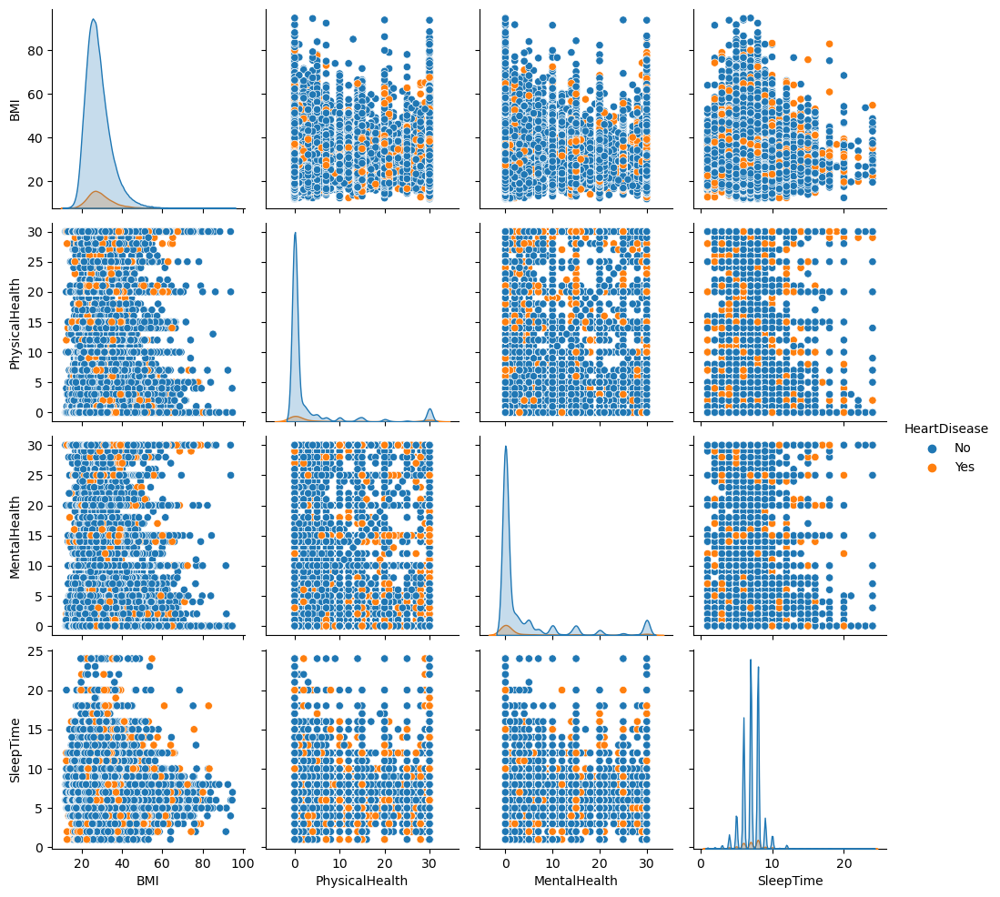

In [11]:
sns.pairplot(data=df,hue='HeartDisease')

In [12]:
df.nunique()

HeartDisease           2
BMI                 3604
Smoking                2
AlcoholDrinking        2
Stroke                 2
PhysicalHealth        31
MentalHealth          31
DiffWalking            2
Sex                    2
AgeCategory           13
Race                   6
Diabetic               4
PhysicalActivity       2
GenHealth              5
SleepTime             24
Asthma                 2
KidneyDisease          2
SkinCancer             2
dtype: int64

In [13]:
df.HeartDisease.value_counts()

No     292422
Yes     27373
Name: HeartDisease, dtype: int64

<Axes: xlabel='HeartDisease', ylabel='count'>

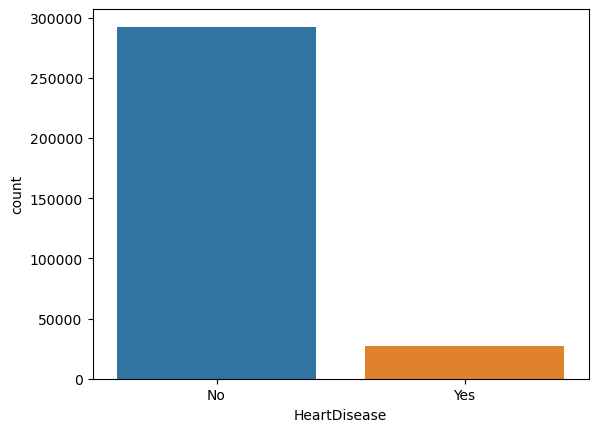

In [14]:
sns.countplot(data=df,x='HeartDisease')

In [15]:
df.groupby(['Sex','HeartDisease'])['HeartDisease'].count()

Sex     HeartDisease
Female  No              156571
        Yes              11234
Male    No              135851
        Yes              16139
Name: HeartDisease, dtype: int64

In [16]:
px.histogram(df,x='Sex',color='HeartDisease',template='plotly_dark',barmode='group',color_discrete_sequence=['#71AEC2 ','#D58989'],title='Distribution of sick and the healthy between male and female')

In [17]:
df.AgeCategory.value_counts()

65-69          34151
60-64          33686
70-74          31065
55-59          29757
50-54          25382
80 or older    24153
45-49          21791
75-79          21482
18-24          21064
40-44          21006
35-39          20550
30-34          18753
25-29          16955
Name: AgeCategory, dtype: int64

In [18]:
px.histogram(df,x='AgeCategory',color='HeartDisease',template='plotly_dark',barmode='group',color_discrete_sequence=['#71AEC2 ','#D58989'])

In [19]:
df.Smoking.value_counts()

No     187887
Yes    131908
Name: Smoking, dtype: int64

In [20]:
px.histogram(df,x='Smoking',color='HeartDisease',template='plotly_dark',barmode='group',color_discrete_sequence=['#71AEC2 ','#D58989'])

In [21]:
df.AlcoholDrinking.value_counts()

No     298018
Yes     21777
Name: AlcoholDrinking, dtype: int64

In [22]:
px.histogram(df,x='AlcoholDrinking',color='HeartDisease',template='plotly_dark',barmode='group',color_discrete_sequence=['#71AEC2 ','#D58989'])

In [23]:
df.PhysicalActivity.value_counts()

Yes    247957
No      71838
Name: PhysicalActivity, dtype: int64

In [24]:
px.histogram(df,x='PhysicalActivity',color='HeartDisease',template='plotly_dark',barmode='group',color_discrete_sequence=['#71AEC2 ','#D58989'])

In [25]:
df.Stroke.value_counts()

No     307726
Yes     12069
Name: Stroke, dtype: int64

In [26]:
px.histogram(df,x='Stroke',color='HeartDisease',template='plotly_dark',barmode='group',color_discrete_sequence=['#71AEC2 ','#D58989'])

# **Data preprocessing**

In [27]:
df.isna().sum()

HeartDisease        0
BMI                 0
Smoking             0
AlcoholDrinking     0
Stroke              0
PhysicalHealth      0
MentalHealth        0
DiffWalking         0
Sex                 0
AgeCategory         0
Race                0
Diabetic            0
PhysicalActivity    0
GenHealth           0
SleepTime           0
Asthma              0
KidneyDisease       0
SkinCancer          0
dtype: int64

In [15]:
df.drop_duplicates(inplace=True)

In [29]:
df.shape

(301717, 18)

 **Scaling the data**

In [16]:
from sklearn.preprocessing import MinMaxScaler
m = MinMaxScaler()
for column in df.columns:
    if pd.api.types.is_numeric_dtype(df[column]):
        df[column] = m.fit_transform(df[[column]])
    else:
        continue
df.head()
   

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,0.0,0.055294,1.0,0.0,0.0,0.100000,1.0,0.0,0.0,0.583333,1.0,0.666667,1.0,1.00,0.173913,1.0,0.0,1.0
1,0.0,0.100447,0.0,0.0,1.0,0.000000,0.0,0.0,0.0,1.000000,1.0,0.000000,1.0,1.00,0.260870,0.0,0.0,0.0
2,0.0,0.175782,1.0,0.0,0.0,0.666667,1.0,0.0,1.0,0.750000,1.0,0.666667,1.0,0.25,0.304348,1.0,0.0,0.0
3,0.0,0.147169,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.916667,1.0,0.000000,0.0,0.50,0.217391,0.0,0.0,1.0
4,0.0,0.141132,0.0,0.0,0.0,0.933333,0.0,1.0,0.0,0.333333,1.0,0.000000,1.0,1.00,0.304348,0.0,0.0,0.0


**Encoding the data**

In [17]:
from sklearn.preprocessing import LabelEncoder
label = LabelEncoder()
from pandas.core.dtypes.common import is_numeric_dtype

for column in df.columns:
    if is_numeric_dtype(df[column]):
        continue
    else:
        df[column] = label.fit_transform(df[column])
df.tail()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
319790,1.0,0.185802,1.0,0.0,0.0,0.233333,0.0,1.0,1.0,0.666667,0.6,0.666667,0.0,0.25,0.217391,1.0,0.0,0.0
319791,0.0,0.215139,1.0,0.0,0.0,0.000000,0.0,0.0,1.0,0.250000,0.6,0.000000,1.0,1.00,0.173913,1.0,0.0,0.0
319792,0.0,0.147531,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.416667,0.6,0.000000,1.0,0.50,0.217391,0.0,0.0,0.0
319793,0.0,0.250996,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.083333,0.6,0.000000,0.0,0.50,0.478261,0.0,0.0,0.0
319794,0.0,0.416999,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,1.000000,0.6,0.000000,1.0,0.50,0.304348,0.0,0.0,0.0


Text(0.5, 1.0, 'Data correlations')

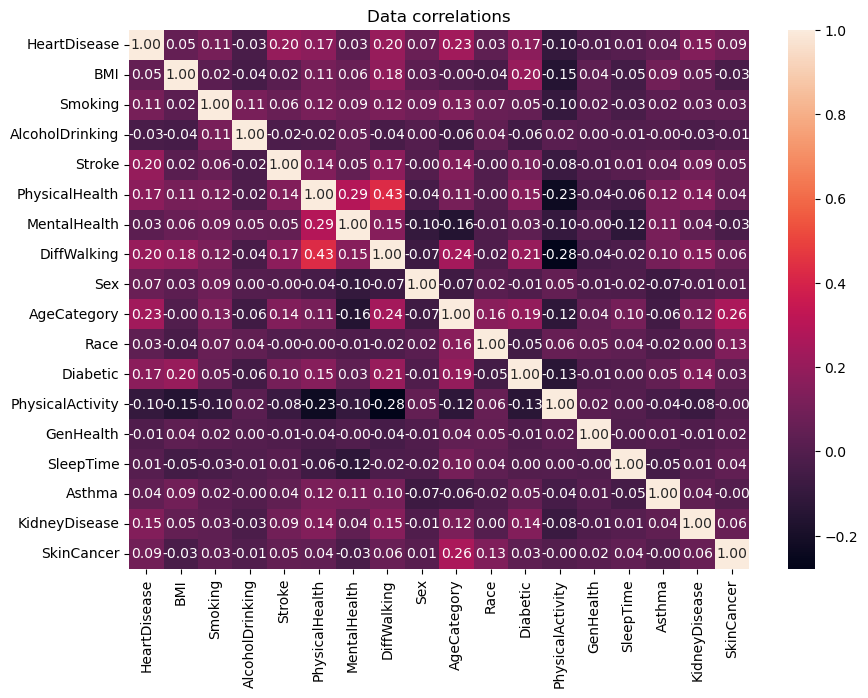

In [9]:
correlation=df.corr()
plt.figure(figsize=(10,7))
sns.heatmap(correlation,annot=True,fmt='.2f',annot_kws={'size': 10})
plt.title("Data correlations")

Text(0.5, 1.0, 'Maximum seven features affecting the disease')

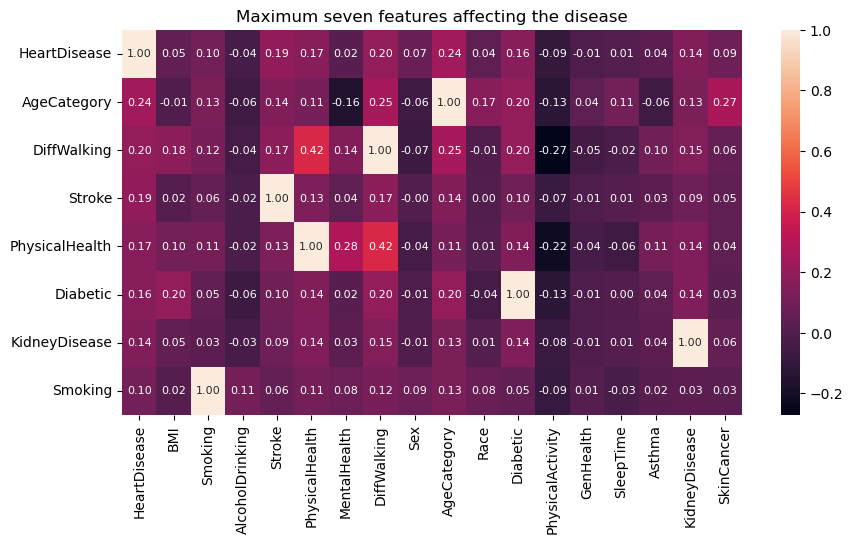

In [37]:
max_8_corr=correlation.nlargest(8,"HeartDisease")
plt.figure(figsize=(10,5))
sns.heatmap(max_8_corr,annot=True,fmt=".2F",annot_kws={"size":8})
plt.title('Maximum seven features affecting the disease')

In [19]:
x = df.drop('HeartDisease',axis = 1)
y = df['HeartDisease']

In [20]:
print(x.shape)
x.head()

(301717, 17)


,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,0.055294,1.0,0.0,0.0,0.100000,1.0,0.0,0.0,0.583333,1.0,0.666667,1.0,1.00,0.173913,1.0,0.0,1.0
1,0.100447,0.0,0.0,1.0,0.000000,0.0,0.0,0.0,1.000000,1.0,0.000000,1.0,1.00,0.260870,0.0,0.0,0.0
2,0.175782,1.0,0.0,0.0,0.666667,1.0,0.0,1.0,0.750000,1.0,0.666667,1.0,0.25,0.304348,1.0,0.0,0.0
3,0.147169,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.916667,1.0,0.000000,0.0,0.50,0.217391,0.0,0.0,1.0
4,0.141132,0.0,0.0,0.0,0.933333,0.0,1.0,0.0,0.333333,1.0,0.000000,1.0,1.00,0.304348,0.0,0.0,0.0


In [21]:
print(y.shape)
y.head()

(301717,)


0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: HeartDisease, dtype: float64

**Train Test splitting**

In [22]:
#importing train test splitting libraries
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=.30,random_state = 1)

In [23]:
print(xtrain.shape)
print(xtest.shape)

(211201, 17)
(90516, 17)


# **Model building**

**KNNClassifier**

In [44]:
from sklearn.neighbors import KNeighborsClassifier
knnc = KNeighborsClassifier()
knnc.fit(xtrain,ytrain)
print('Model name: KNN Classifier')
print('Training accuracy',knnc.score(xtrain,ytrain))
print('Testing accuracy',knnc.score(xtest,ytest))
print(classification_report(ytest, knnc.predict(xtest)))

Model name: KNN Classifier
Training accuracy 0.9209236698689873
Testing accuracy 0.8982610809138716
              precision    recall  f1-score   support

         0.0       0.92      0.97      0.95     82369
         1.0       0.34      0.14      0.20      8147

    accuracy                           0.90     90516
   macro avg       0.63      0.56      0.57     90516
weighted avg       0.87      0.90      0.88     90516



**Logistic regression**

In [45]:
from sklearn.linear_model import LogisticRegression
logr = LogisticRegression()
logr.fit(xtrain,ytrain)
print('Model name: Logistic Regression')
print('Training accuracy',logr.score(xtrain,ytrain))
print('Testing accuracy',logr.score(xtest,ytest))
print(classification_report(ytest, logr.predict(xtest)))

Model name: Logistic Regression
Training accuracy 0.9104975828712932
Testing accuracy 0.9096844756728092
              precision    recall  f1-score   support

         0.0       0.92      0.99      0.95     82369
         1.0       0.49      0.09      0.15      8147

    accuracy                           0.91     90516
   macro avg       0.70      0.54      0.55     90516
weighted avg       0.88      0.91      0.88     90516



**Decision Tree**

In [46]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()
dt.fit(xtrain,ytrain)
print('Model name: Decision Tree')
print('Training accuracy',dt.score(xtrain,ytrain))
print('Testing accuracy',dt.score(xtest,ytest))
print(classification_report(ytest, dt.predict(xtest)))

Model name: Decision Tree
Training accuracy 0.9975000118370652
Testing accuracy 0.8537385655574705
              precision    recall  f1-score   support

         0.0       0.93      0.91      0.92     82369
         1.0       0.22      0.25      0.24      8147

    accuracy                           0.85     90516
   macro avg       0.57      0.58      0.58     90516
weighted avg       0.86      0.85      0.86     90516



**Xg boost**

In [47]:
import xgboost 
from xgboost import XGBClassifier
xgb = XGBClassifier()
xgb.fit(xtrain,ytrain)
print('Model name: XG boost classifier')
print('Training accuracy',xgb.score(xtrain,ytrain))
print('Testing accuracy',xgb.score(xtest,ytest))
print(classification_report(ytest, xgb.predict(xtest)))

Model name: XG boost classifier
Training accuracy 0.9175761478402091
Testing accuracy 0.9107008705643201
              precision    recall  f1-score   support

         0.0       0.92      0.99      0.95     82369
         1.0       0.52      0.10      0.17      8147

    accuracy                           0.91     90516
   macro avg       0.72      0.54      0.56     90516
weighted avg       0.88      0.91      0.88     90516



**Naive Bayes**

In [48]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(xtrain,ytrain)
print('Model name: Gaussian Naive Bayes')
print('Training accuracy',gnb.score(xtrain,ytrain))
print('Testing accuracy',gnb.score(xtest,ytest))
print(classification_report(ytest, gnb.predict(xtest)))

Model name: Gaussian Naive Bayes
Training accuracy 0.8425149502133039
Testing accuracy 0.8410336294135844
              precision    recall  f1-score   support

         0.0       0.94      0.88      0.91     82369
         1.0       0.27      0.45      0.34      8147

    accuracy                           0.84     90516
   macro avg       0.61      0.66      0.62     90516
weighted avg       0.88      0.84      0.86     90516



**Adaboost classifier**

In [24]:
from sklearn.ensemble import AdaBoostClassifier
adb = AdaBoostClassifier()
adb.fit(xtrain,ytrain)
print('Model name: Adaboost Classifier')
print('Training accuracy',adb.score(xtrain,ytrain))
print('Testing accuracy',adb.score(xtest,ytest))
print(classification_report(ytest, adb.predict(xtest)))

Model name: Adaboost Classifier
Training accuracy 0.9111083754338284
Testing accuracy 0.9108334438110389
              precision    recall  f1-score   support

         0.0       0.92      0.99      0.95     82369
         1.0       0.52      0.11      0.18      8147

    accuracy                           0.91     90516
   macro avg       0.72      0.55      0.57     90516
weighted avg       0.88      0.91      0.88     90516



**Random Forest Classifier**

In [25]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier()
rfc.fit(xtrain,ytrain)
print('Model name: RandomForest Classifier')
print('Training accuracy',rfc.score(xtrain,ytrain))
print('Testing accuracy',rfc.score(xtest,ytest))
print(classification_report(ytest, rfc.predict(xtest)))

Model name: RandomForest Classifier
Training accuracy 0.9974431939242712
Testing accuracy 0.8984488930133899
              precision    recall  f1-score   support

         0.0       0.92      0.98      0.95     82369
         1.0       0.32      0.11      0.16      8147

    accuracy                           0.90     90516
   macro avg       0.62      0.54      0.56     90516
weighted avg       0.86      0.90      0.88     90516



# Performing PCA 

In [41]:
from sklearn.decomposition import PCA
pca = PCA(n_components=8)
x_pca = pca.fit_transform(x)
x_pca

array([[ 0.42129303,  0.49105953, -0.67210247, ...,  0.27112913,
         0.53152932,  0.72111261],
       [-0.50612428,  0.34341596, -0.18346933, ...,  0.31227034,
         0.02389575, -0.21704793],
       [ 0.74032295, -0.27637724, -0.04874459, ...,  0.14711472,
         0.09092236,  0.24359133],
       ...,
       [-0.66804699,  0.25544964, -0.15959792, ..., -0.05501494,
        -0.0996394 , -0.14600442],
       [-0.36240218,  0.53907386,  0.40365357, ..., -0.7333558 ,
         0.07415728, -0.00685404],
       [-0.56845173,  0.32387132, -0.11864951, ...,  0.23016065,
         0.05308382, -0.28317193]])

In [42]:
x_pca = pd.DataFrame(x_pca, columns=['pca1','pca2','pca3','pca4','pca5','pca6','pca7','pca8'])
x_pca.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8
0,0.421293,0.491060,-0.672102,-0.375703,0.829366,0.271129,0.531529,0.721113
1,-0.506124,0.343416,-0.183469,-0.522078,-0.193259,0.312270,0.023896,-0.217048
2,0.740323,-0.276377,-0.048745,0.400659,1.020384,0.147115,0.090922,0.243591
3,-0.154871,0.636867,0.439595,-0.250570,-0.661250,0.163808,0.765578,0.496179
4,-0.209044,0.634905,0.208222,-0.391568,0.329212,0.443231,-0.814559,-0.004516


# Performing SMOTEtomek

In [43]:
from imblearn.combine import SMOTETomek
sm = SMOTETomek(random_state=100)
new_x,new_y = sm.fit_resample(x_pca,y)
new_y.value_counts()

0.0    262277
1.0    262277
Name: HeartDisease, dtype: int64

# **Model evaluation After doing PCA and SMOTEtomek**

In [44]:
xtrain,xtest,ytrain,ytest = train_test_split(new_x,new_y,test_size=.30,random_state = 1)

**KNN classifier**

Model name: KNN Classifier
Training accuracy 0.9015787595966088
Testing accuracy 0.8586615999542471
              precision    recall  f1-score   support

         0.0       0.90      0.80      0.85     78794
         1.0       0.82      0.91      0.87     78573

    accuracy                           0.86    157367
   macro avg       0.86      0.86      0.86    157367
weighted avg       0.86      0.86      0.86    157367



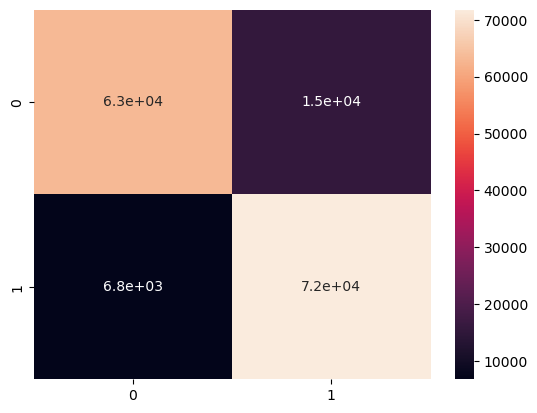

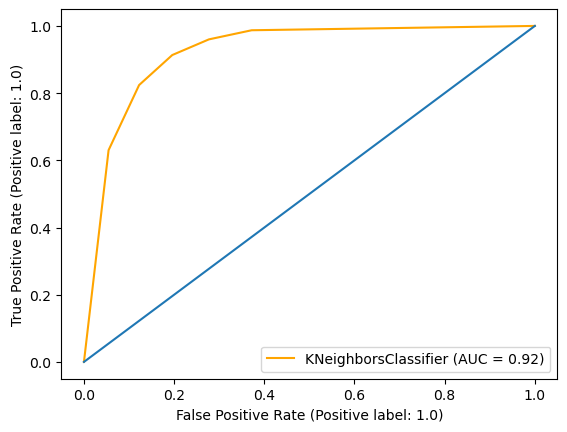

In [45]:
from sklearn.neighbors import KNeighborsClassifier

#model evaluation metrics
knnc = KNeighborsClassifier()
knnc.fit(xtrain,ytrain)
print('Model name: KNN Classifier')
print('Training accuracy',knnc.score(xtrain,ytrain))
print('Testing accuracy',knnc.score(xtest,ytest))
print(classification_report(ytest, knnc.predict(xtest)))

#confusion matrix
cm=confusion_matrix(ytest, knnc.predict(xtest))
sns.heatmap(cm, annot=True)

#roc curve
RocCurveDisplay.from_estimator(knnc, xtest , ytest, color='orange')
plt.plot([0,1],[0,1])

 **Logistic regression classifier**

Model name: Logistic Regression classifier
Training accuracy 0.73569870393015
Testing accuracy 0.7361263797365394
              precision    recall  f1-score   support

         0.0       0.73      0.75      0.74     78794
         1.0       0.74      0.72      0.73     78573

    accuracy                           0.74    157367
   macro avg       0.74      0.74      0.74    157367
weighted avg       0.74      0.74      0.74    157367



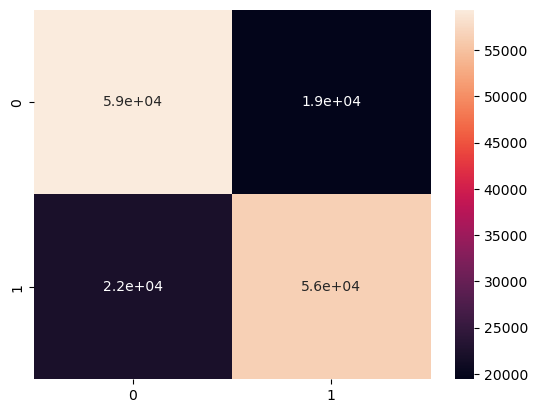

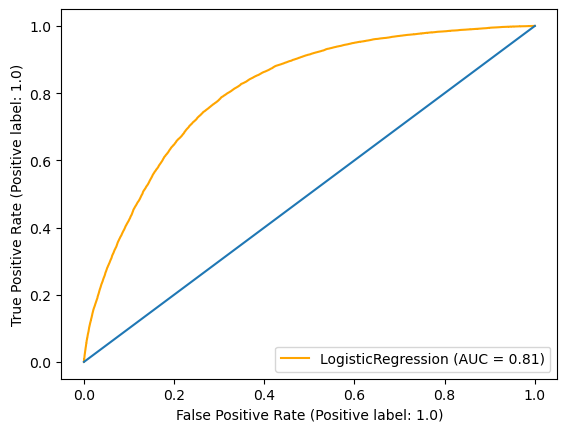

In [46]:
from sklearn.linear_model import LogisticRegression

#model evaluation metrics
logr = LogisticRegression()
logr.fit(xtrain,ytrain)
print('Model name: Logistic Regression classifier')
print('Training accuracy',logr.score(xtrain,ytrain))
print('Testing accuracy',logr.score(xtest,ytest))
print(classification_report(ytest, logr.predict(xtest)))

#confusion matrix
cm=confusion_matrix(ytest, logr.predict(xtest))
sns.heatmap(cm, annot=True)

#roc curve
RocCurveDisplay.from_estimator(logr, xtest , ytest, color='orange')
plt.plot([0,1],[0,1])

**Decision Tree**

Model name: Decision Tree
Training accuracy 0.9985239128836261
Testing accuracy 0.853406368552492
              precision    recall  f1-score   support

         0.0       0.86      0.84      0.85     78794
         1.0       0.85      0.86      0.85     78573

    accuracy                           0.85    157367
   macro avg       0.85      0.85      0.85    157367
weighted avg       0.85      0.85      0.85    157367



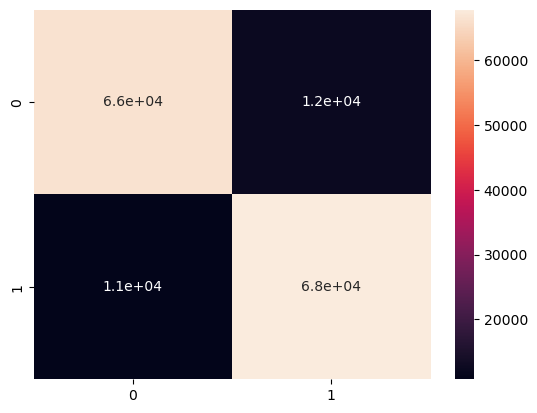

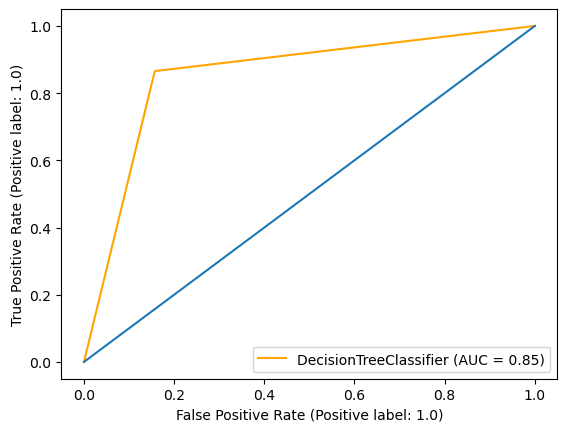

In [47]:
from sklearn.tree import DecisionTreeClassifier

#model evaluation metrics
dt = DecisionTreeClassifier()
dt.fit(xtrain,ytrain)
print('Model name: Decision Tree')
print('Training accuracy',dt.score(xtrain,ytrain))
print('Testing accuracy',dt.score(xtest,ytest))
print(classification_report(ytest, dt.predict(xtest)))

#confusion matrix
cm=confusion_matrix(ytest, dt.predict(xtest))
sns.heatmap(cm, annot=True)

#roc curve
RocCurveDisplay.from_estimator(dt, xtest , ytest, color='orange')
plt.plot([0,1],[0,1])

**Xg boost**

Model name: XG boost classifier
Training accuracy 0.7926615049007726
Testing accuracy 0.7860606099118621
              precision    recall  f1-score   support

         0.0       0.82      0.73      0.77     78794
         1.0       0.76      0.84      0.80     78573

    accuracy                           0.79    157367
   macro avg       0.79      0.79      0.79    157367
weighted avg       0.79      0.79      0.79    157367



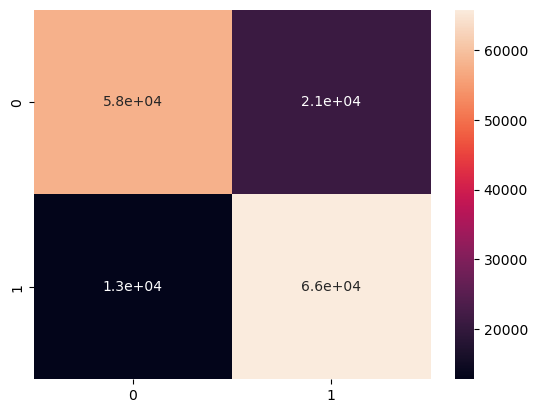

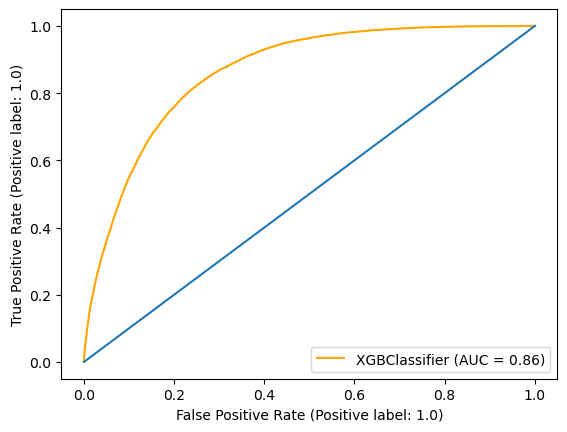

In [48]:
import xgboost 
from xgboost import XGBClassifier

#model evaluation metrics
xgb = XGBClassifier()
xgb.fit(xtrain,ytrain)
print('Model name: XG boost classifier')
print('Training accuracy',xgb.score(xtrain,ytrain))
print('Testing accuracy',xgb.score(xtest,ytest))
print(classification_report(ytest, xgb.predict(xtest)))

#confusion matrix
cm=confusion_matrix(ytest, xgb.predict(xtest))
sns.heatmap(cm, annot=True)

#roc curve
RocCurveDisplay.from_estimator(xgb, xtest , ytest, color='orange')
plt.plot([0,1],[0,1])

**Naive Bayes**

Model name: Gaussian Naive Bayes
Training accuracy 0.7026692121453102
Testing accuracy 0.7035020048676025
              precision    recall  f1-score   support

         0.0       0.68      0.77      0.72     78794
         1.0       0.73      0.64      0.68     78573

    accuracy                           0.70    157367
   macro avg       0.71      0.70      0.70    157367
weighted avg       0.71      0.70      0.70    157367



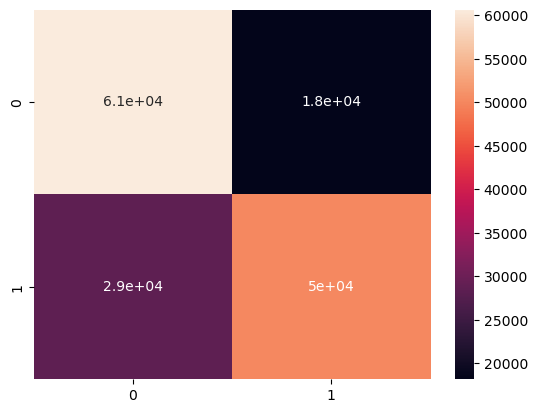

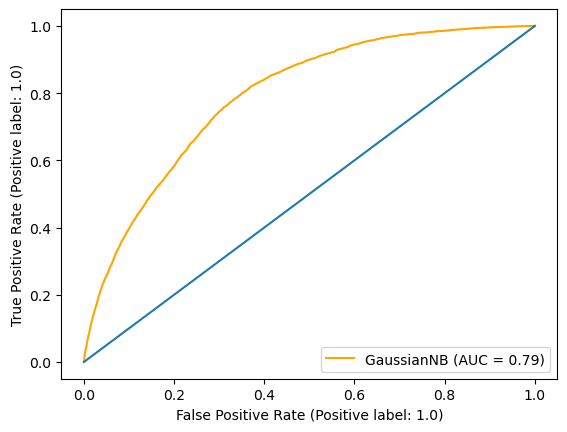

In [49]:
from sklearn.naive_bayes import GaussianNB

#model evaluation metrics
gnb = GaussianNB()
gnb.fit(xtrain,ytrain)
print('Model name: Gaussian Naive Bayes')
print('Training accuracy',gnb.score(xtrain,ytrain))
print('Testing accuracy',gnb.score(xtest,ytest))
print(classification_report(ytest, gnb.predict(xtest)))

#confusion matrix
cm=confusion_matrix(ytest, gnb.predict(xtest))
sns.heatmap(cm, annot=True)

#roc curve
RocCurveDisplay.from_estimator(gnb, xtest , ytest, color='orange')
plt.plot([0,1],[0,1])

**Adaboost classifier**

Model name: Adaboost Classifier
Training accuracy 0.7531775362417514
Testing accuracy 0.7534489441877903
              precision    recall  f1-score   support

         0.0       0.78      0.71      0.74     78794
         1.0       0.73      0.80      0.76     78573

    accuracy                           0.75    157367
   macro avg       0.76      0.75      0.75    157367
weighted avg       0.76      0.75      0.75    157367



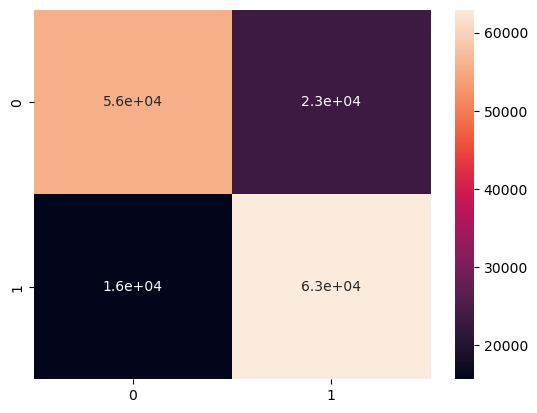

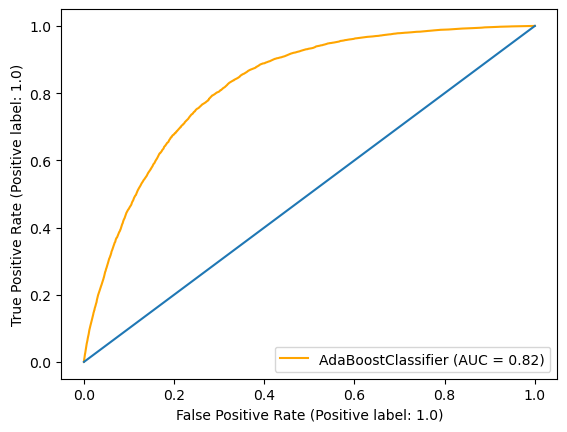

In [50]:
from sklearn.ensemble import AdaBoostClassifier

#model evaluation metrics
adb = AdaBoostClassifier()
adb.fit(xtrain,ytrain)
print('Model name: Adaboost Classifier')
print('Training accuracy',adb.score(xtrain,ytrain))
print('Testing accuracy',adb.score(xtest,ytest))
print(classification_report(ytest, adb.predict(xtest)))

#confusion matrix
cm=confusion_matrix(ytest, adb.predict(xtest))
sns.heatmap(cm, annot=True)

#roc curve
RocCurveDisplay.from_estimator(adb, xtest , ytest, color='orange')
plt.plot([0,1],[0,1])

**Random Forest Classifier**

Model name: RandomForest Classifier
Training accuracy 0.9984966788039882
Testing accuracy 0.891082628505341
              precision    recall  f1-score   support

         0.0       0.91      0.87      0.89     78794
         1.0       0.87      0.92      0.89     78573

    accuracy                           0.89    157367
   macro avg       0.89      0.89      0.89    157367
weighted avg       0.89      0.89      0.89    157367



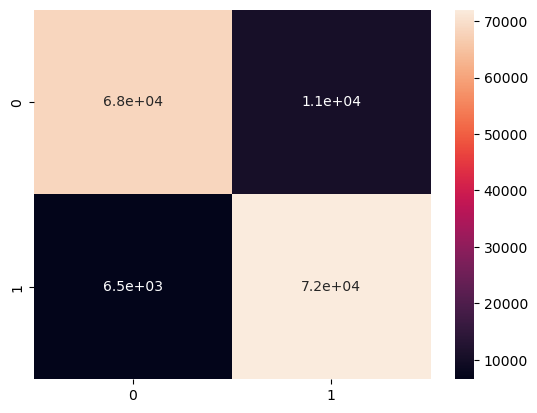

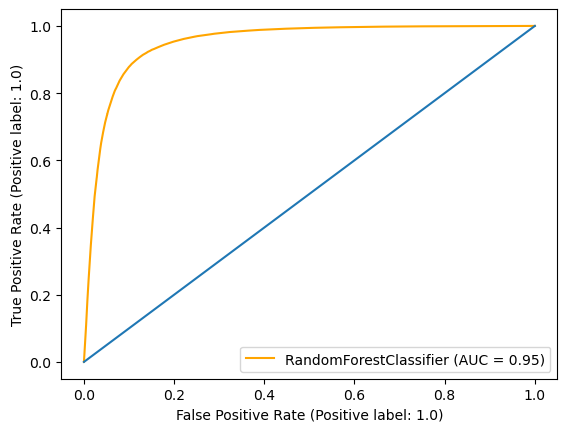

In [51]:
from sklearn.ensemble import RandomForestClassifier

#model evaluation metrics
rfc = RandomForestClassifier()
rfc.fit(xtrain,ytrain)
print('Model name: RandomForest Classifier')
print('Training accuracy',rfc.score(xtrain,ytrain))
print('Testing accuracy',rfc.score(xtest,ytest))
print(classification_report(ytest, rfc.predict(xtest)))

#confusion matrix
cm=confusion_matrix(ytest, rfc.predict(xtest))
sns.heatmap(cm, annot=True)

#roc curve
RocCurveDisplay.from_estimator(rfc, xtest , ytest, color='orange')
plt.plot([0,1],[0,1])